# Watch Your Lane - A lane detection application

Identifying lanes on the road is a common task performed by all human drivers to ensure their vehicles are within lane constraints when driving, so as to make sure traffic is smooth and minimize chances of collisions with other cars due to lane misalignment.

Similarly, it is a critical task for an autonomous vehicle to perform. It turns out that recognising lane markings on roads is possible using well known computer vision techniques.

# Load the  Original Images

Let's load and visualize the given images

In [32]:
#import packages
import os # to use the system dependent functionality.
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
import numpy as np # importing numpy
import cv2 # importing open cv
%matplotlib inline

# Making sure we import our images with the right names
test_img_dir = "test_images/"
original_image_names = os.listdir(test_img_dir) # listdir() method in python is used to get the list of all files and directories in the specified directory.
#original_image_names.remove(".DS_Store")
#print(original_image_names)
original_image_names = list(map(lambda name: test_img_dir + name, original_image_names))
print(original_image_names)

['test_images/video_challenge_4s.jpg', 'test_images/video_yellow_lane_left_13s.jpg', 'test_images/solidWhiteRight.jpg', 'test_images/solidYellowLeft.jpg', 'test_images/solidYellowCurve.jpg', 'test_images/whiteCarLaneSwitch.jpg', 'test_images/video_challenge_6s.jpg', 'test_images/solidWhiteCurve.jpg', 'test_images/video_yellow_lane_left_12s.jpg', 'test_images/video_challenge_5s.jpg', 'test_images/video_yellow_lane_left_3s.jpg', 'test_images/video_challenge_2s.jpg', 'test_images/video_challenge_1s.jpg', 'test_images/video_challenge_0s.jpg']


In [33]:
# Function for showing  list of images in columns and rows
def show_image_list(img_list, cols=2, fig_size=(15, 15), img_labels=original_image_names, show_ticks=True):
    img_count = len(img_list)
    rows = img_count / cols
    cmap = None
    plt.figure(figsize=fig_size)
    for i in range(0, img_count):
        img_name = img_labels[i]
        
        plt.subplot(rows, cols, i+1)
        img = img_list[i]
        if len(img.shape) < 3:
            cmap = "gray"
        
        if not show_ticks:
            plt.xticks([])
            plt.yticks([])
            
        plt.title(img_name[len(test_img_dir):])    
        plt.imshow(img, cmap=cmap)

    plt.tight_layout()
    plt.show()

Total image count:  14


<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


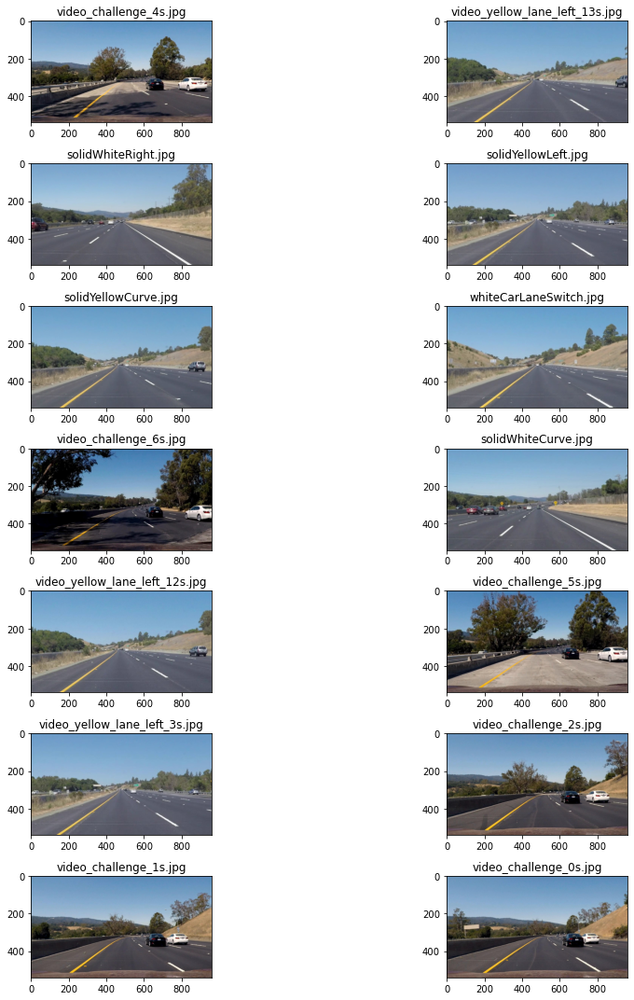

In [40]:
original_images2 = list(map(lambda img_name: mpimg.imread(img_name), original_image_names))
original_images = list(map(lambda img: cv2.resize(img,(960,540)), original_images2))
print("Total image count: ", len(original_images))
show_image_list(original_images)

Check the dimensions of one of the images

In [41]:
img_shape = original_images[0].shape
img_shape

(540, 960, 3)

So width x height of image is 960 x 540. Also image contains 3 channedls RGB

# Project Pipeline 

 Our project pipeline will look like this:
* First we will convert original images to HSL
* Then we will isolate yellow and white from HSL image because lane lines contains these colours.
* We will convert image to grayscale for easier manipulation because it contains only one channel.
* For smoothening of edges we will Apply Gaussian Blur.
* Then we will apply Canny Edge Detection on smoothened gray image
* After that we will trace our region Of Interest and discard all other lines identified by our previous step that are outside this region
* Then we will apply a Hough Transform to find lanes within our region of interest and mark them as red
* Now we will separate left and right lanes.
* Then we will extrapolate our detection to create two smooth lines.

## Convert to different color spaces

In [42]:
def convert_to_hsv(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
def convert_to_hsl(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

In [43]:
hsv_images = list(map(lambda img: convert_to_hsv(img), original_images))
hsl_images = list(map(lambda img: convert_to_hsl(img), original_images))
len(hsv_images)

14

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


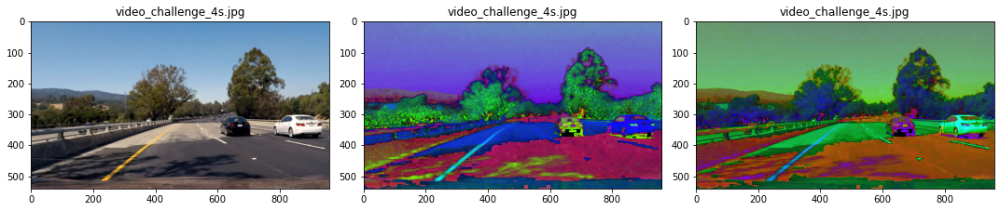

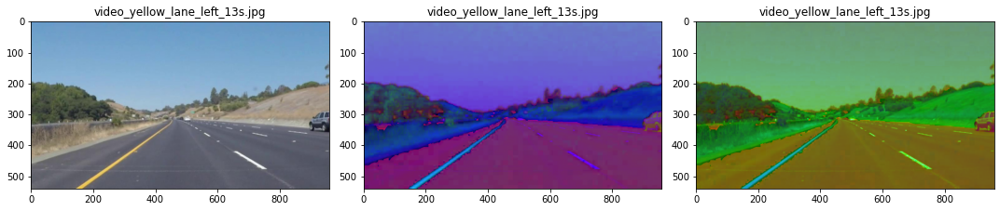

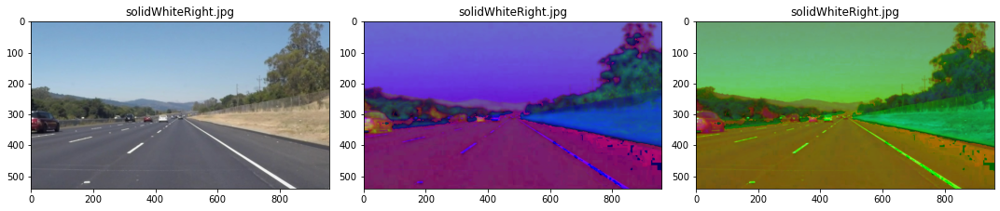

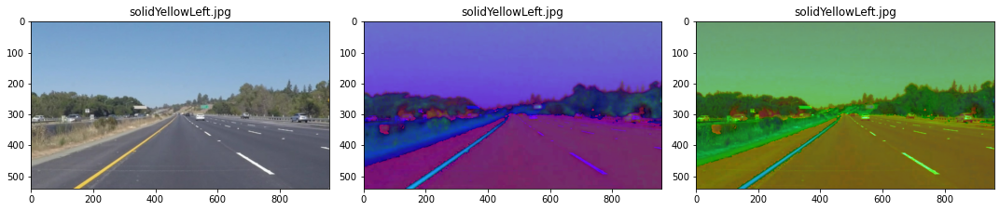

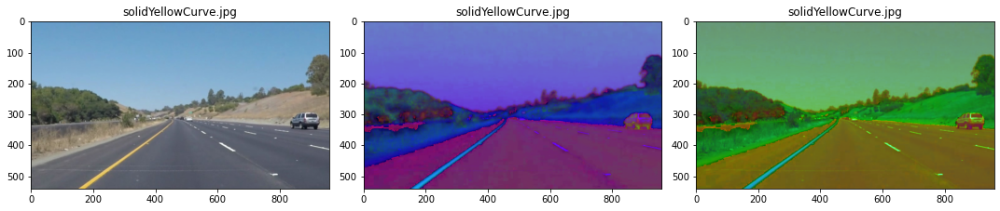

...

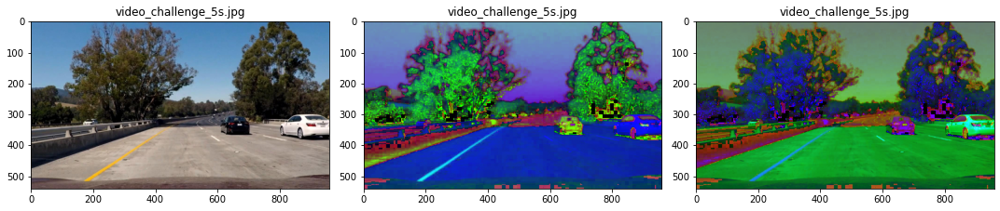

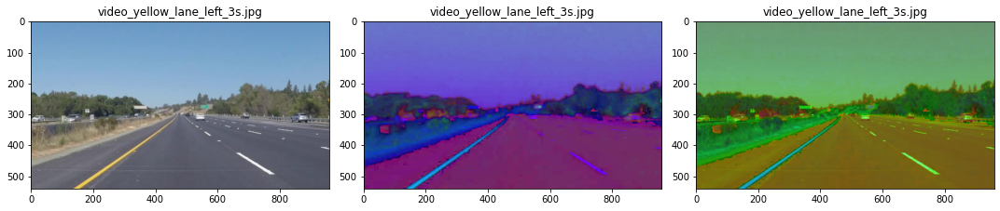

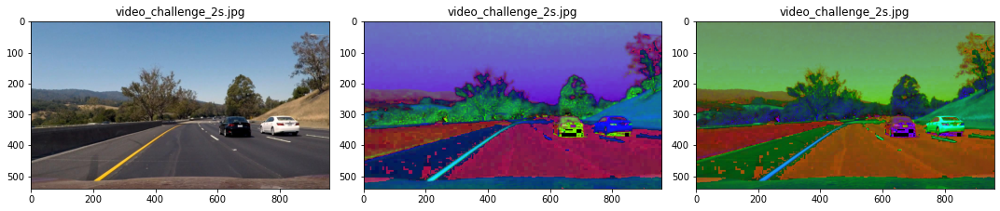

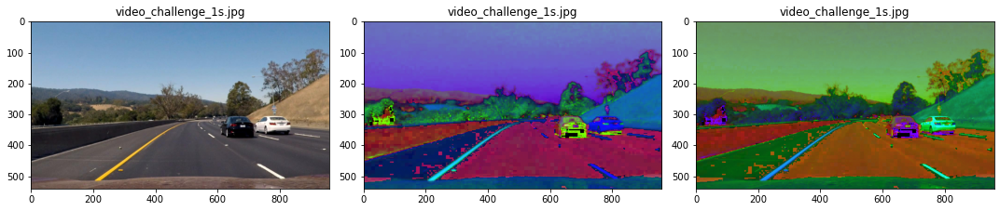

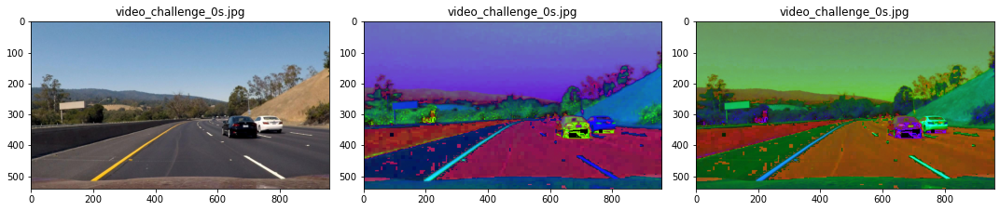

In [44]:
img_count = len(hsv_images)
hsx_images = list(zip(original_images, hsv_images, hsl_images))

k = 0
for hsx in hsx_images:
    img_name = original_image_names[k]
    show_image_list(hsx, cols=3, fig_size=(15, 15), img_labels=[img_name, img_name, img_name] )
    k += 1

When we compare these images we can see that, HSL is better at contrasting lane lines than HSV because in HSV "blurring" our white lines are high, so HSL is better. 

## Isolating Yellow And White From HSL Image

We first isolate yellow and white from the original image. OpenCV, when converting from RGB to HSL, maps the components of the latter color space in the following range:
* H is between 0 and 180 (i.e. H = H/2)
* S & L are between 0 and 255

In [45]:
# Image should have already been converted to HSL color space
def yellow_isolation_hsl(img):
    #OpenCV encodes the data in ****HLS*** format
    low_threshold = np.array([15, 38, 115], dtype=np.uint8)
    
    high_threshold = np.array([35, 204, 255], dtype=np.uint8)  
    
    yellow_mask = cv2.inRange(img, low_threshold, high_threshold)
    
    return yellow_mask
    
    

In [46]:
# Image should have already been converted to HSL color space
def white_isolation_hsl(img):
    # Caution - OpenCV encodes the data in ***HLS*** format
    
    low_threshold = np.array([0, 200, 0], dtype=np.uint8)
    
    high_threshold = np.array([180, 255, 255], dtype=np.uint8)  
    
    white_mask = cv2.inRange(img, low_threshold, high_threshold)
    
    return white_mask

In [47]:
#hsl_yellow_images = list(map(lambda img: cv2.bitwise_and(img, img, mask = isolate_yellow_hsl(img)), original_images))
hsl_yellow_images = list(map(lambda img: yellow_isolation_hsl(img), hsl_images))
hsl_white_images = list(map(lambda img: white_isolation_hsl(img), hsl_images))

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


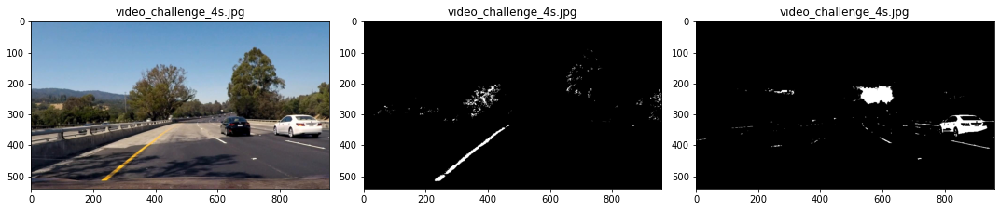

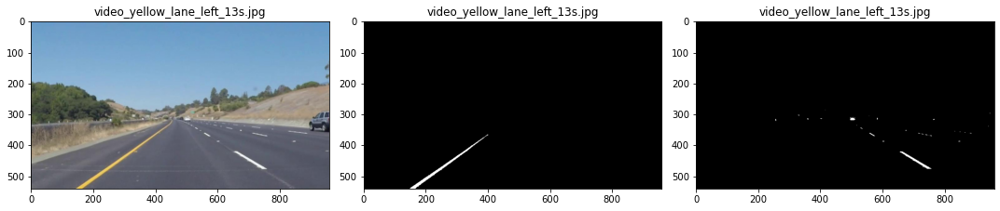

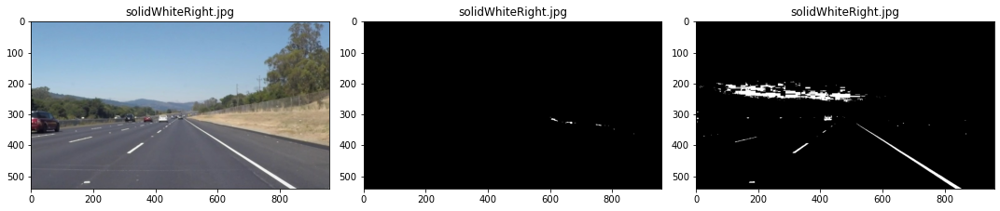

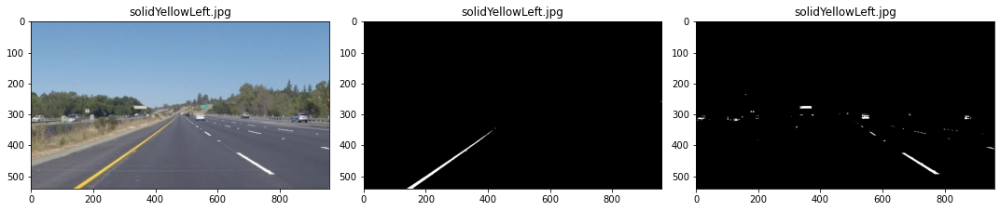

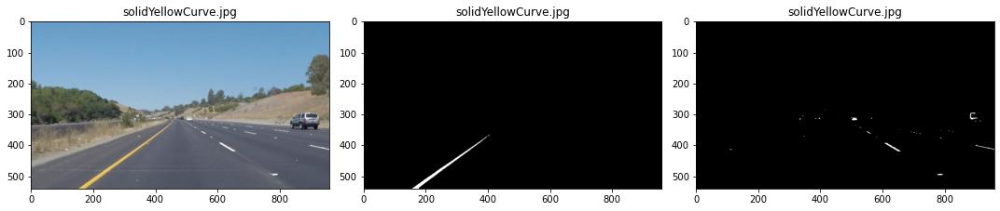

...

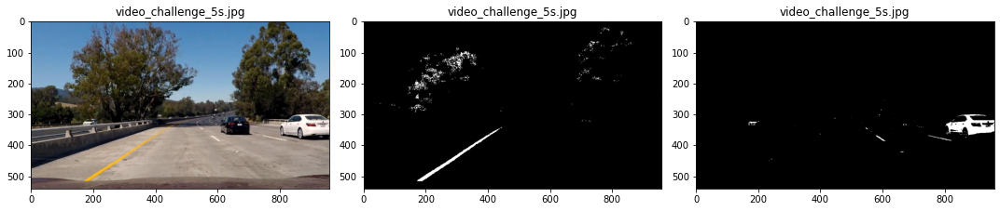

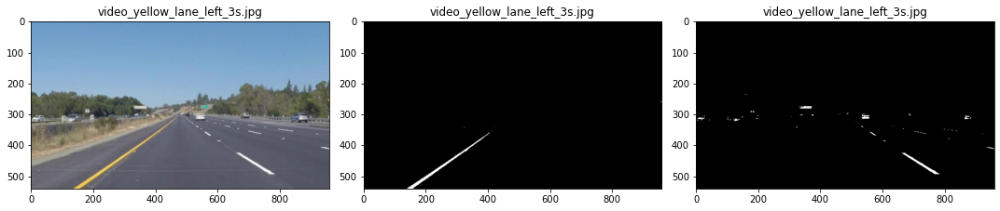

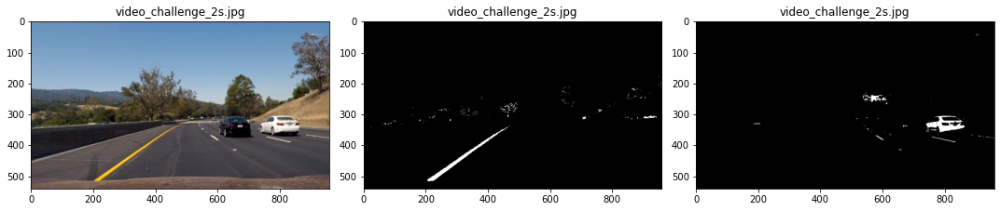

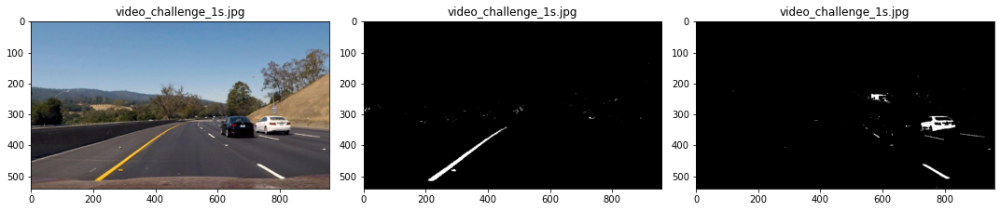

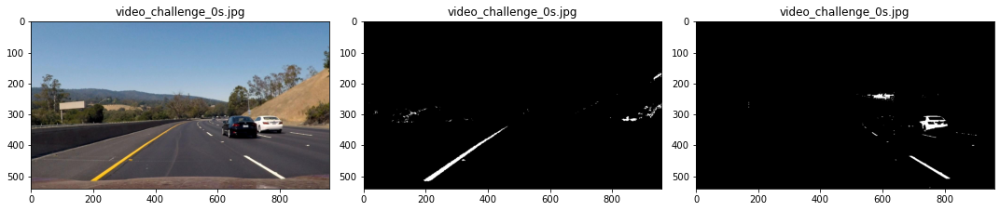

In [48]:
img_count = len(hsv_images)
isolated_hsl_images = list(zip(original_images, hsl_yellow_images, hsl_white_images))

k = 0
for isolated_hsl in isolated_hsl_images:
    img_name = original_image_names[k]
    show_image_list(isolated_hsl, cols=3, fig_size=(15, 15), img_labels=[img_name, img_name, img_name] )
    k += 1

We can observe how the yellow and the white of the lanes are very well isolated. Let's now combine those two masks using an _OR_ operation and then combine with the original image using an _AND_ operation to only retain the intersecting elements.

In [49]:
def mask_yellow_white_with_original(img, hsl_yellow, hsl_white):
    hsl_mask_combined = cv2.bitwise_or(hsl_yellow, hsl_white)
    return cv2.bitwise_and(img, img, mask=hsl_mask_combined)

def filter_img_hsl(img):
    hsl_img = convert_to_hsl(img)
    hsl_yellow = yellow_isolation_hsl(hsl_img)
    hsl_white = white_isolation_hsl(hsl_img)
    return mask_yellow_white_with_original(img, hsl_yellow, hsl_white)

In [50]:
combined_hsl_images = hsl_images = list(map(lambda img: filter_img_hsl(img), original_images))

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


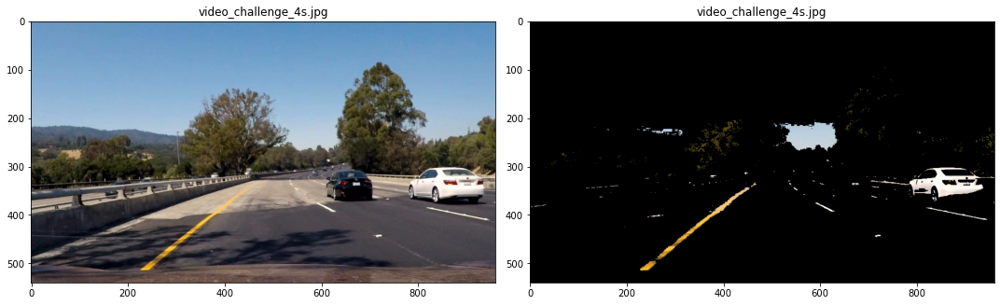

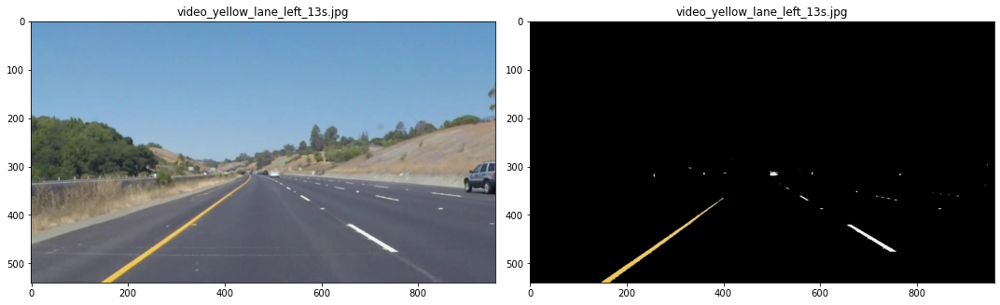

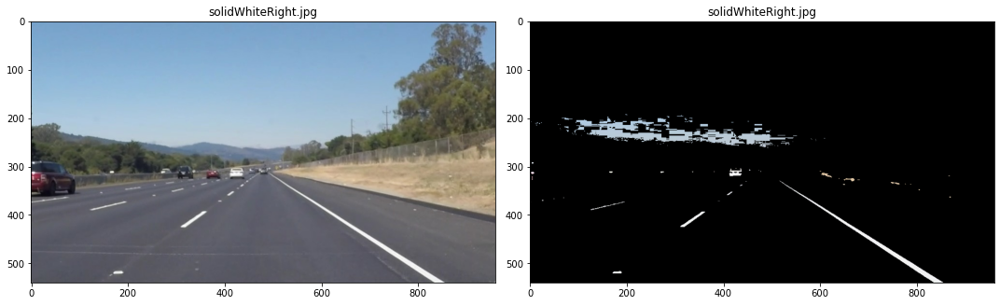

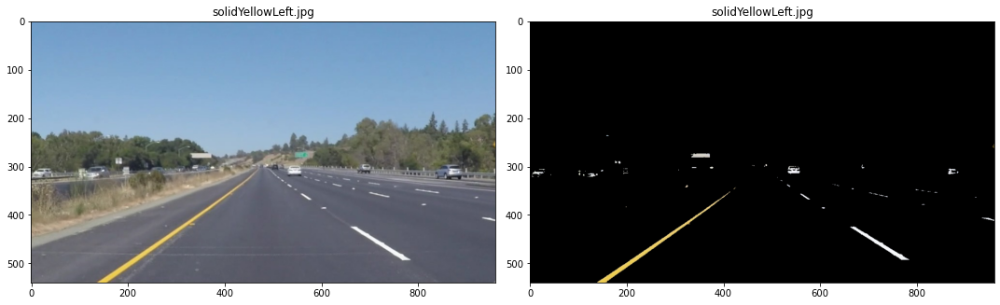

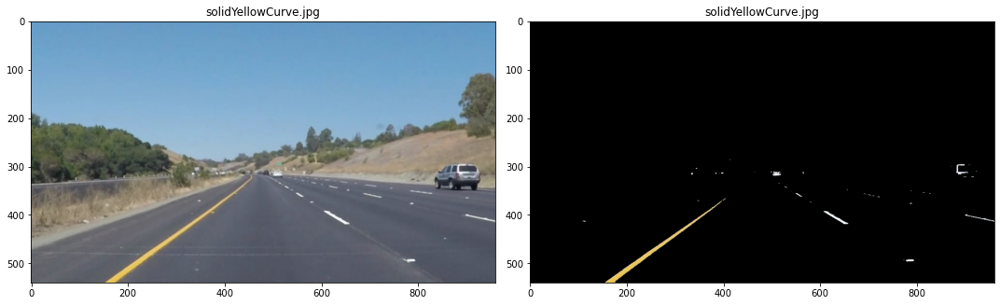

...

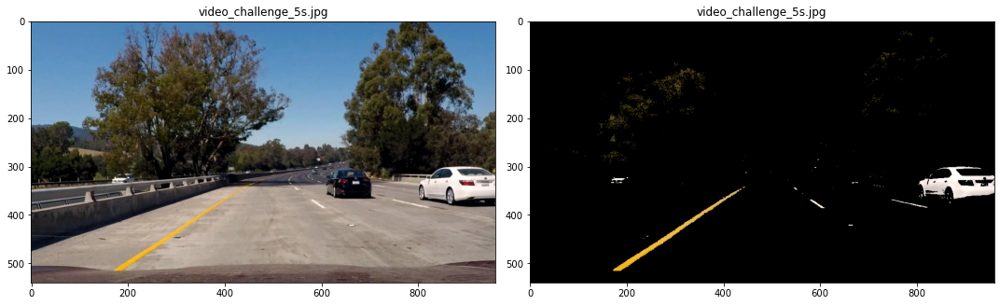

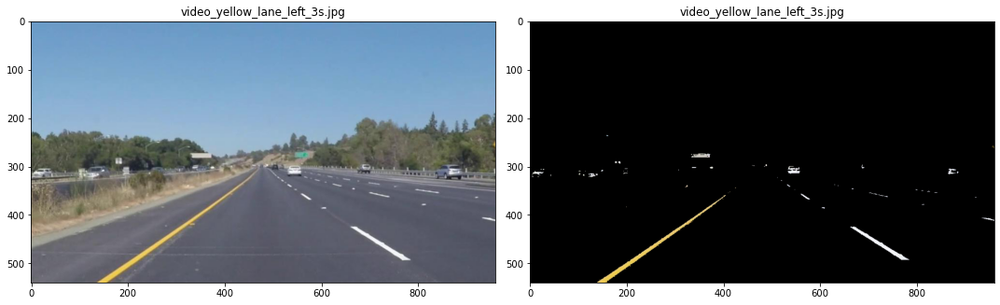

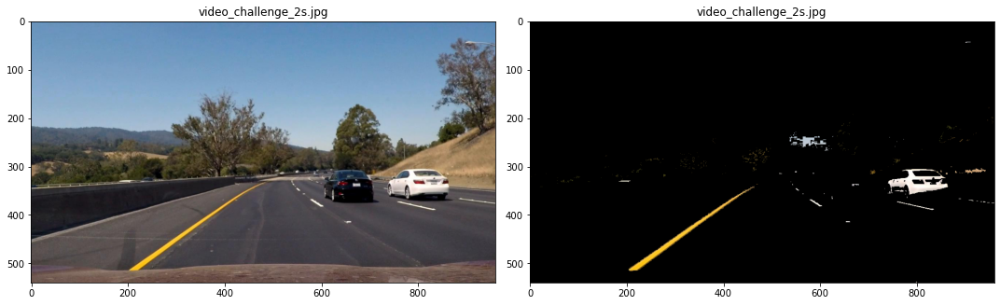

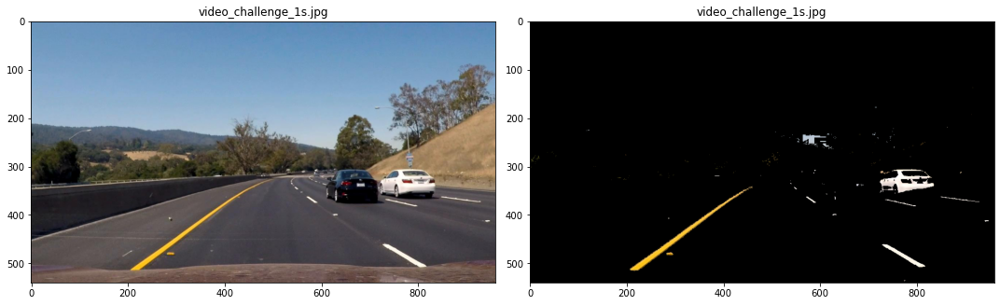

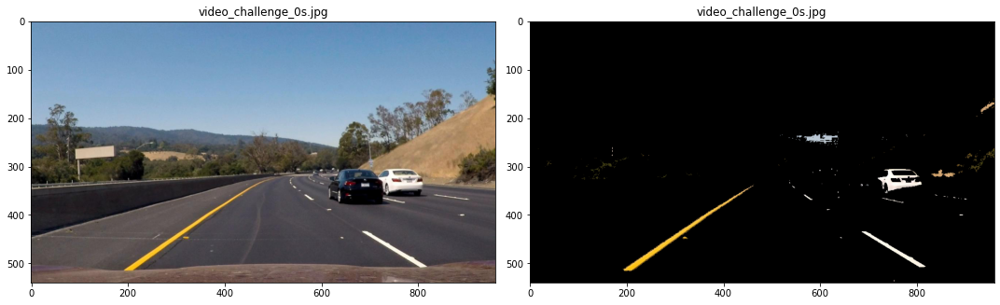

In [51]:
img_count = len(combined_hsl_images)
isolated_combined_hsl = list(zip(original_images, combined_hsl_images))

k = 0
for combined_hsl in isolated_combined_hsl:
    img_name = original_image_names[k]
    show_image_list(combined_hsl, cols=2, fig_size=(15, 15), img_labels=[img_name, img_name] )
    k += 1

## Convert to Grayscale

To reduce the number of channels let's convert our image to grayscale. Since the road is of black color, so anything that is much brighter on the road will come out with a high contrast in a grayscale image 

In [52]:
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


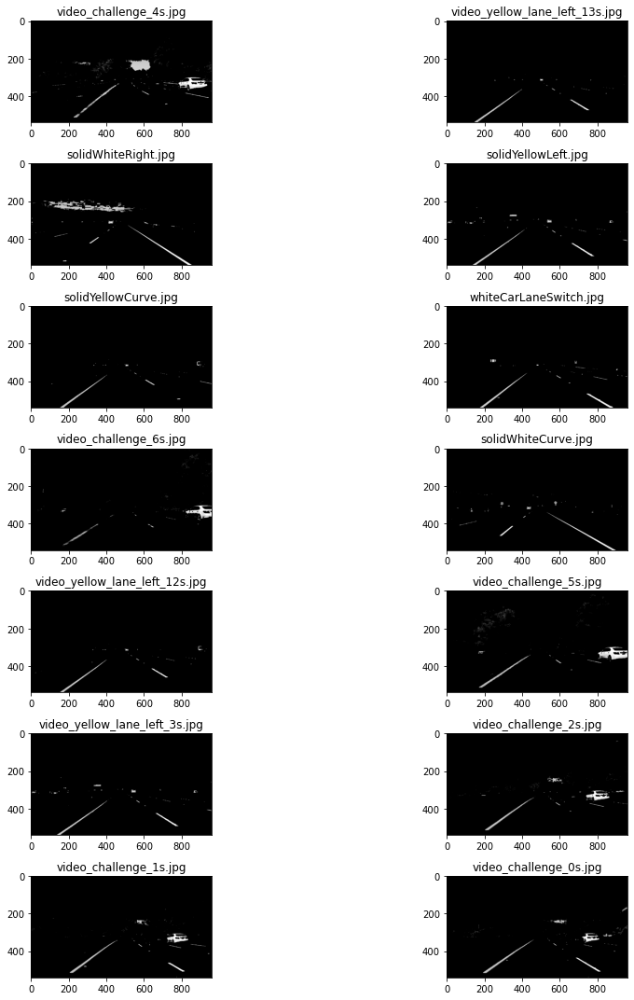

In [53]:
grayscale_images = list(map(lambda img: grayscale(img), combined_hsl_images))
show_image_list(grayscale_images)

As stated above, colored lane lines contrast highly with the black of the road.

## Gaussian Blur

Gaussian Blur (also referred to as Gaussian smoothing) is a pre-processing technique used to smoothen the edges of an image to reduce noise.
It is possible to choose the intensity of the blur by specifying a *kernel* parameter, which is an odd number.

In [54]:
def gaussian_blur(grayscale_img, kernel_size=3):
    return cv2.GaussianBlur(grayscale_img, (kernel_size, kernel_size), 0) 

Let's check how different blurs affect the image

In [55]:
blurred_1 = list(map(lambda img: gaussian_blur(img, kernel_size=5), grayscale_images))
blurred_2 = list(map(lambda img: gaussian_blur(img, kernel_size=11), grayscale_images))
blurred_3 = list(map(lambda img: gaussian_blur(img, kernel_size=21), grayscale_images))

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


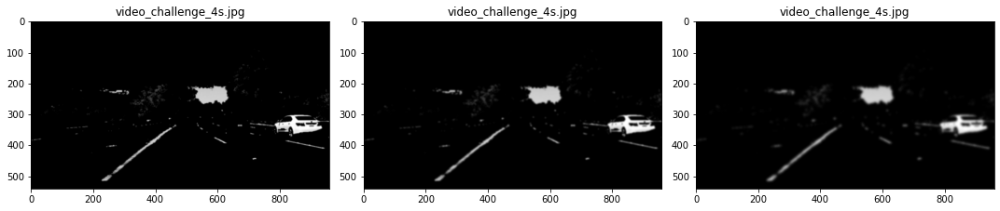

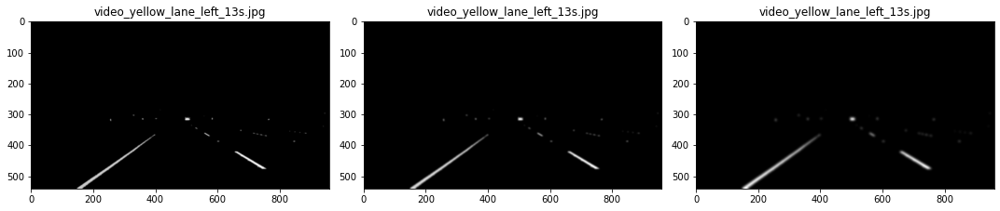

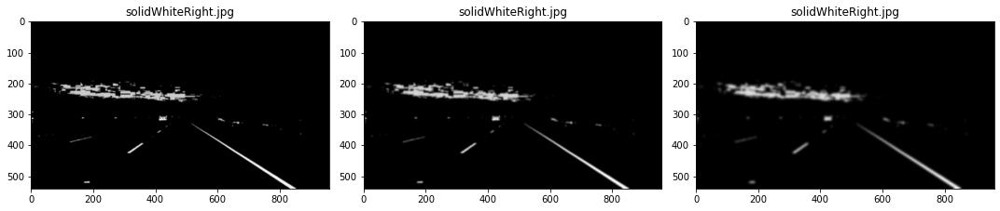

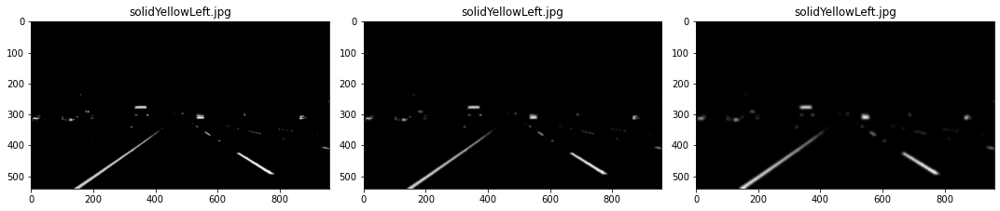

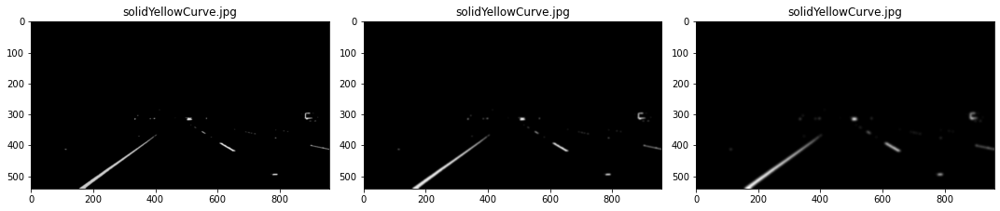

...

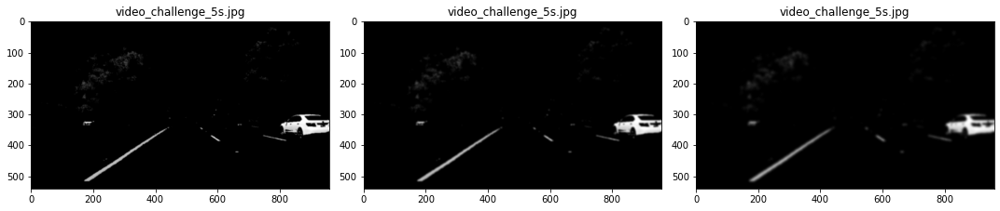

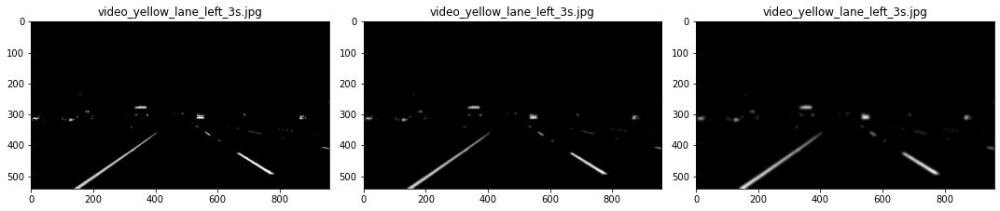

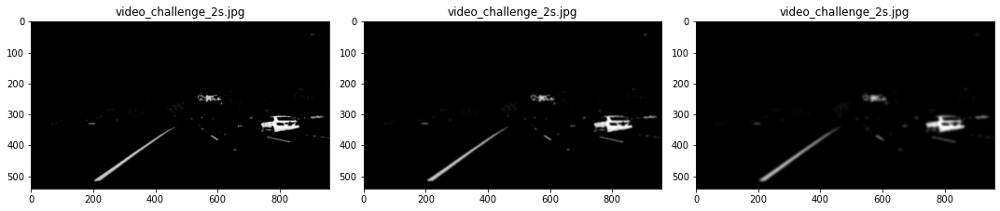

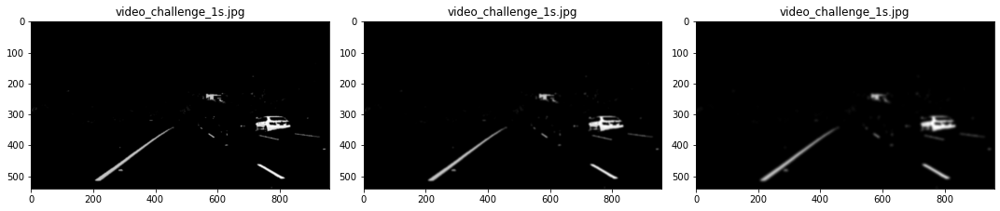

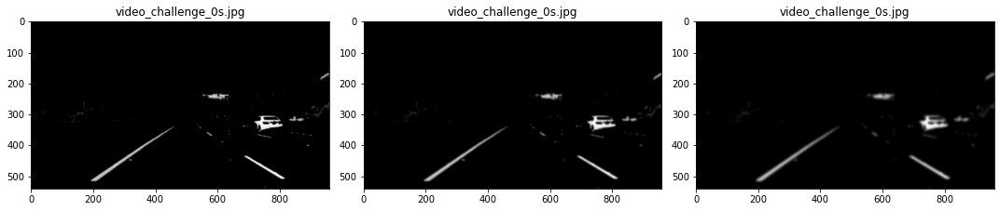

In [56]:
img_count = len(blurred_1)
blur_list = list(zip(blurred_1, blurred_2, blurred_3))

k = 0
for blurs in blur_list:
    img_name = original_image_names[k]
    show_image_list(blurs, cols=3, fig_size=(15, 15), img_labels=[img_name, img_name, img_name] )
    k += 1

We can see how increasing the kernel makes the image more blurry. For our task, we will choose a kernel size of 5 for our gaussian blur (images on the left).

## Canny Edge Detection

Now that we have sufficiently pre-processed the image, we can apply a Canny Edge Detector, whose role it is to identify lines in an image and discard all other data. The resulting image ends up being _wiry_, which enables us to focus on lane detection even more, since we are concerned with lines.

In [57]:
def canny_edge_detector(blurred_img, low_threshold, high_threshold):
    return cv2.Canny(blurred_img, low_threshold, high_threshold)

In [58]:
canny_1 = list(map(lambda img: canny_edge_detector(img, 50, 150), blurred_2)) 
canny_2 = list(map(lambda img: canny_edge_detector(img, 0, 10), blurred_2)) 
canny_3 = list(map(lambda img: canny_edge_detector(img, 10, 50), blurred_2)) 

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


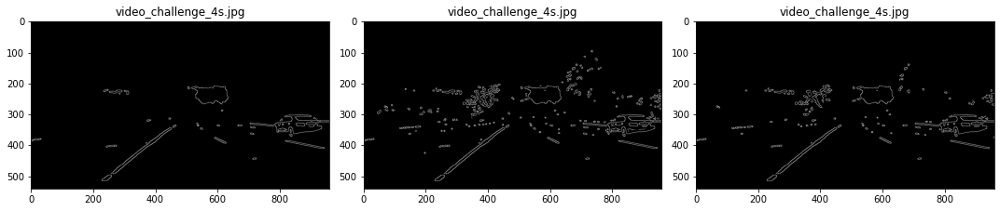

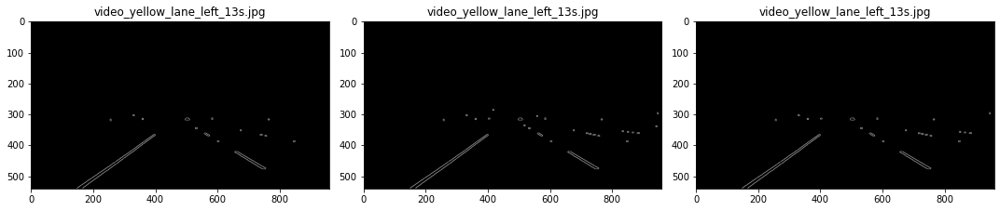

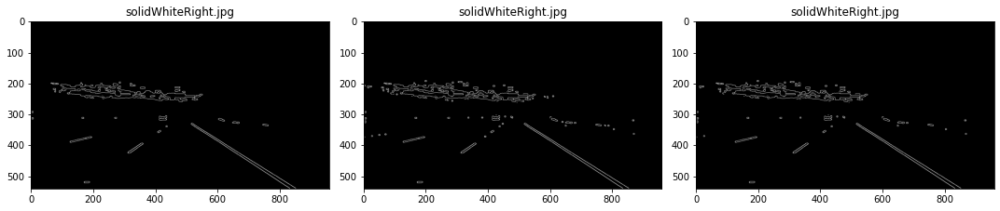

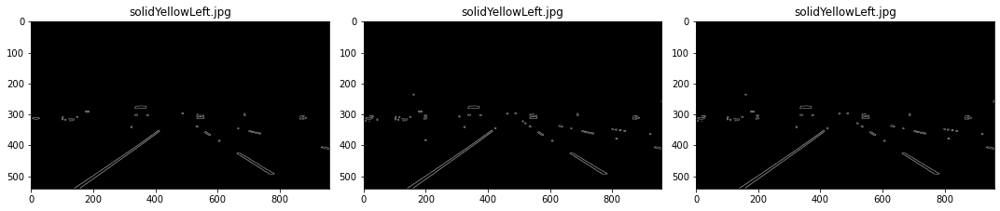

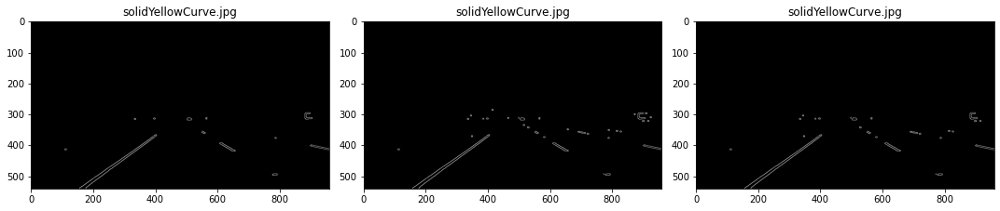

...

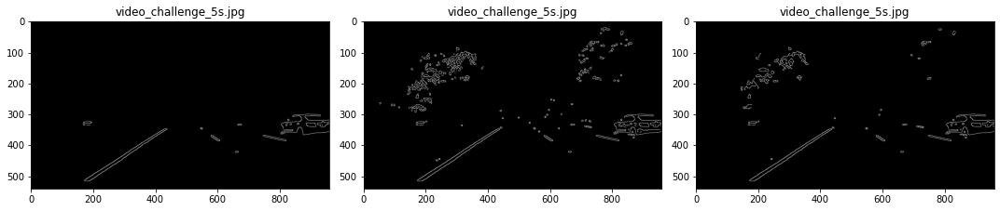

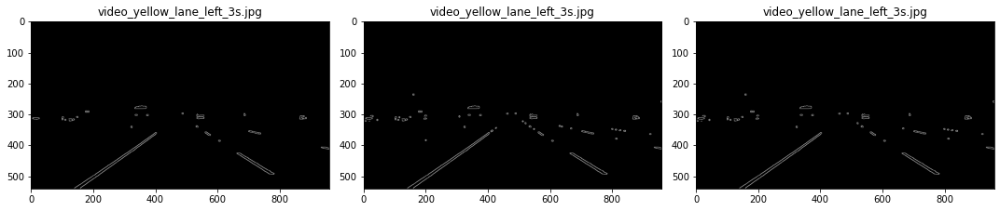

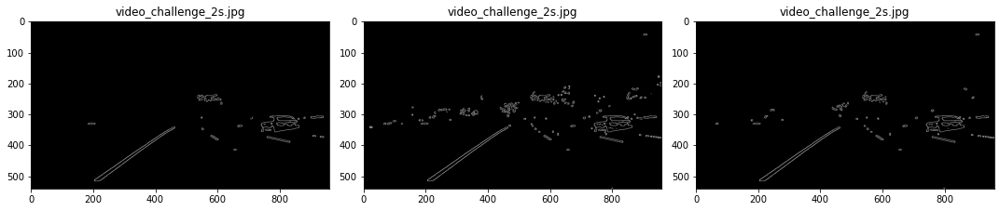

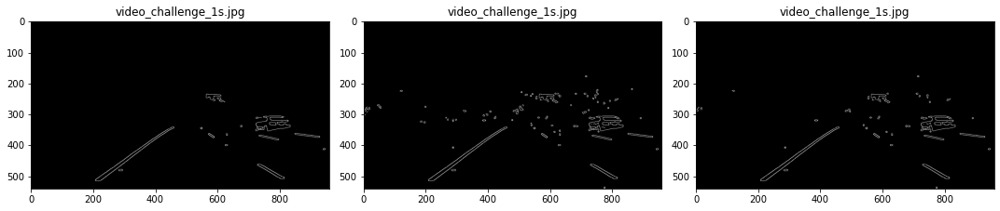

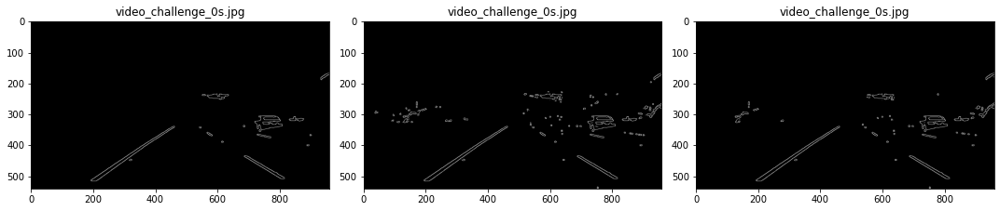

In [59]:
img_count = len(canny_1)
canny_list = list(zip(canny_1, canny_2, canny_3))

k = 0
for cannys in canny_list:
    img_name = original_image_names[k]
    show_image_list(cannys, cols=3, fig_size=(15, 15), img_labels=[img_name, img_name, img_name])
    k += 1

Now, we will opt for the images with threshold parameters (50, 150) as they exhibit the least noise.

## Region Of Interest

Our next step is to determine a region of interest and discard any lines outside of this polygon. One crucial assumption in this task is that the camera remains in the sample place across all these image, and lanes are flat, therefore we can identify the critical region we are interested in.

Looking at the above images, we "guess" what that region may be by following the contours of the lanes the car is in and define a polygon which will act as our region of interest below.

In [60]:
def get_vertices_for_img(img):
    imshape = img.shape
    height = imshape[0]
    width = imshape[1]

    vert = None
    
    if (width, height) == (960, 540):
        region_bottom_left = (130 ,img_shape[0] - 1)
        region_top_left = (410, 330)
        region_top_right = (650, 350)
        region_bottom_right = (img_shape[1] - 30,img_shape[0] - 1)
        vert = np.array([[region_bottom_left , region_top_left, region_top_right, region_bottom_right]], dtype=np.int32)
    else:
        region_bottom_left = (200 , 680)
        region_top_left = (600, 450)
        region_top_right = (750, 450)
        region_bottom_right = (1100, 650)
        vert = np.array([[region_bottom_left , region_top_left, region_top_right, region_bottom_right]], dtype=np.int32)

    return vert



In [61]:
def region_of_interest(img):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
        
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    vert = get_vertices_for_img(img)    
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vert, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [62]:
segmented_images = list(map(lambda img: region_of_interest(img), canny_1))
canny_segmented_images = list(zip(canny_1, segmented_images))

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


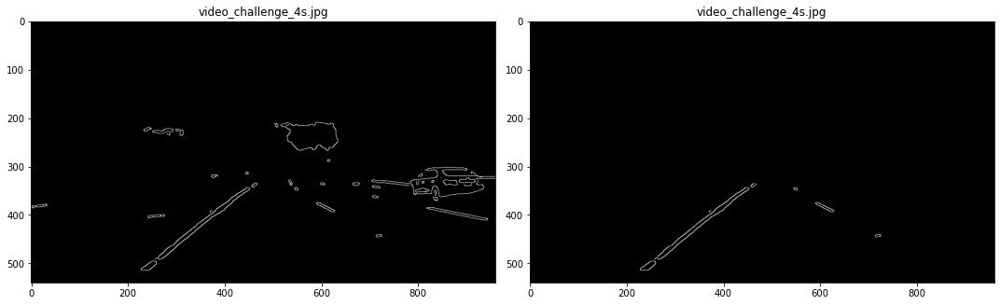

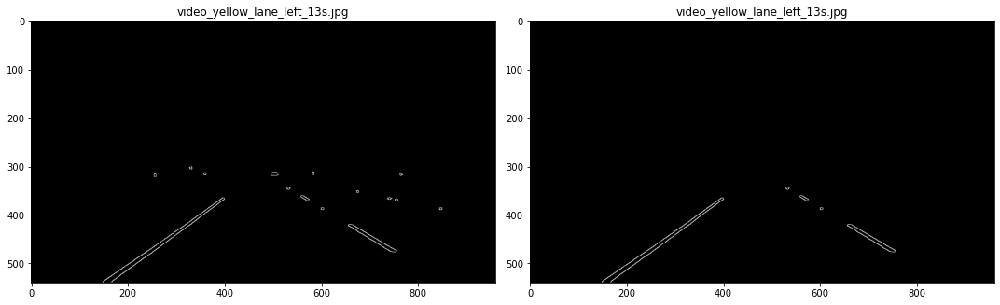

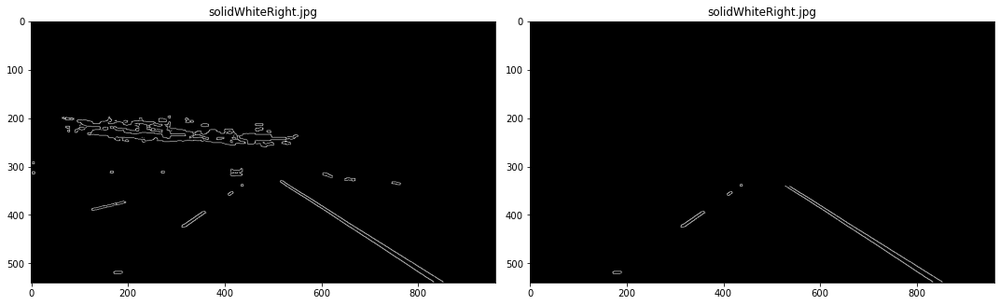

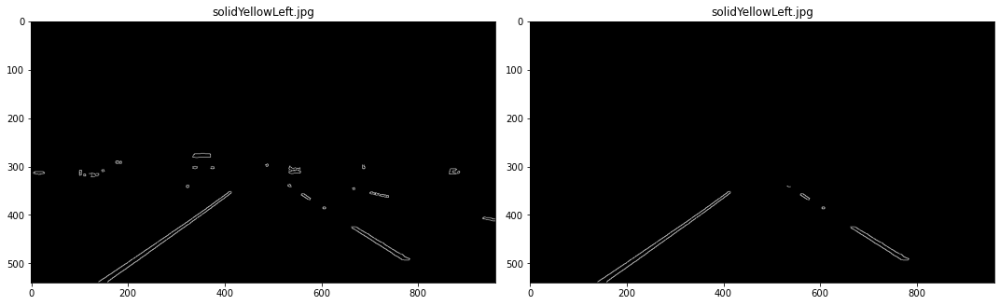

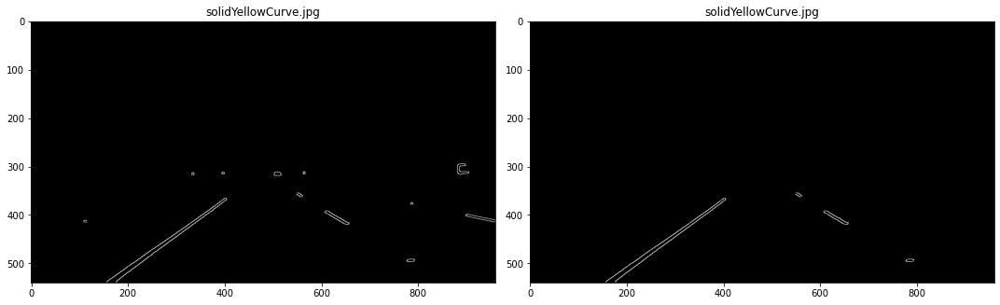

...

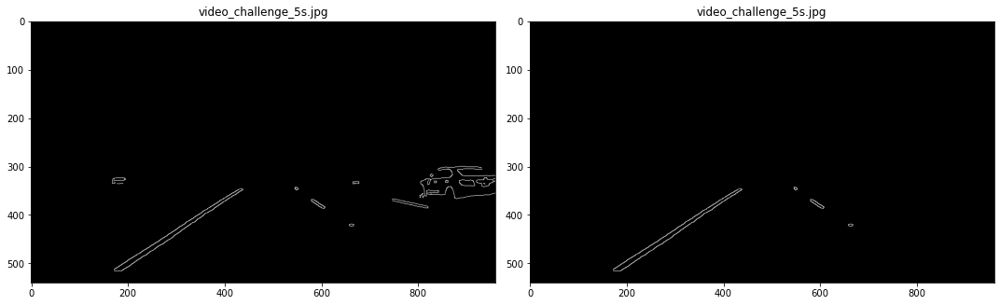

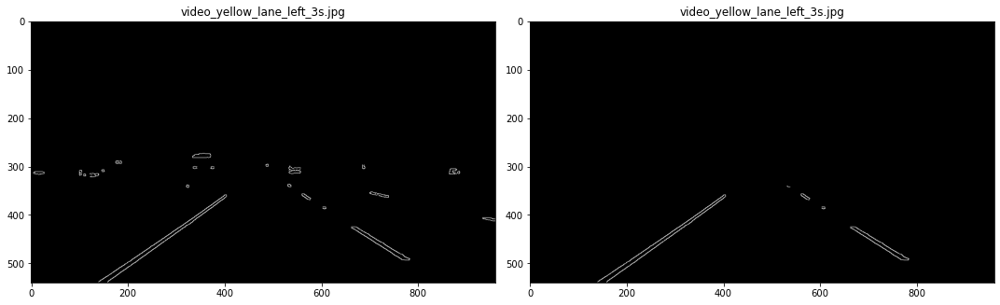

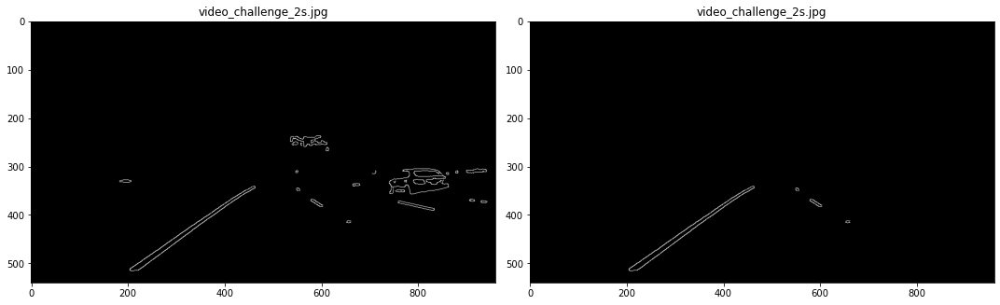

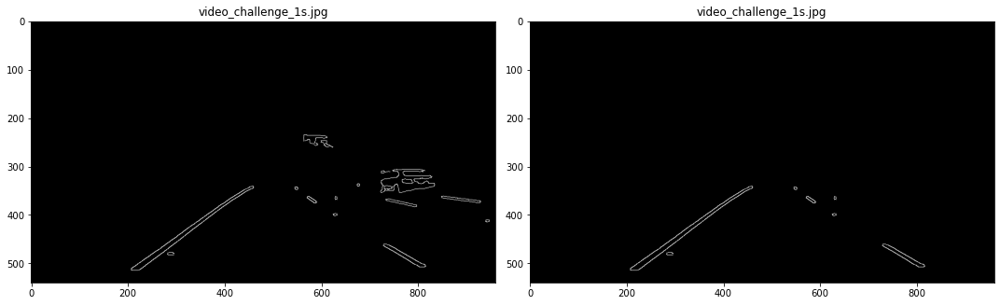

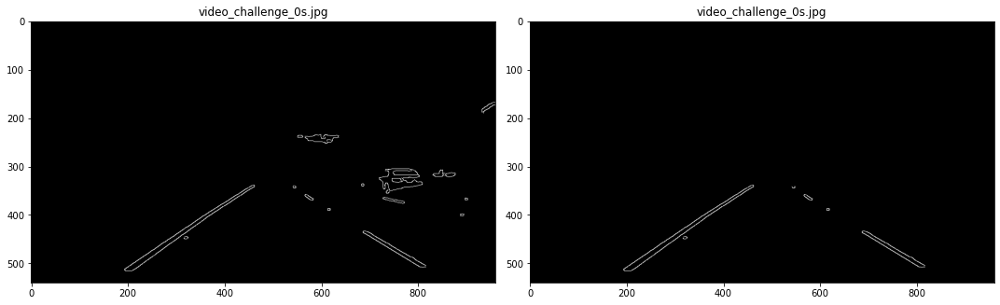

In [63]:
k = 0
for canny_segmented_img in canny_segmented_images: 
    img_name = original_image_names[k]
    show_image_list(canny_segmented_img, img_labels=[img_name, img_name])
    k += 1

## Hough Transform

The next step is to apply the [Hough Transform](https://en.wikipedia.org/wiki/Hough_transform) technique to extract lines and color them. The goal of Hough Transform is to find lines by identifiying all points that lie on them. This is done by converting our current system denoted by axis (x,y) to a _parametric_ one where axes are (m, b).


The OpenCV Probabilistic Hough Transform requires the following parameters:
* ρ and θ for accuracy
* a threshold value which indicates the minimum number of votes to detect a line (i.e. how many intersecting sinusoidals)
* a minimum line length: shorter lines will be rejected by the algorithm
* a maximum line gap: maximum gap allowed between line segments to treat them as a single line

In [64]:
def hough_transform(canny_img, rho, theta, threshold, min_line_len, max_line_gap):
    return cv2.HoughLinesP(canny_img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)

In [65]:
rho = 1
theta = (np.pi/180) * 1
threshold = 15
min_line_length = 20
max_line_gap = 10

In [66]:
hough_lines_per_image = list(map(lambda img: hough_transform(img, rho, theta, threshold, min_line_length, max_line_gap), 
                                 segmented_images))

## Separating Left And Right Lanes

### Drawing Lines

Let's see what lines `hough_transform` function has identified:

In [67]:
def draw_lines(img, lines, color=[255, 0, 0], thickness=10, make_copy=True):
    # Copy the passed image
    img_copy = np.copy(img) if make_copy else img
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img_copy, (x1, y1), (x2, y2), color, thickness)
    
    return img_copy

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


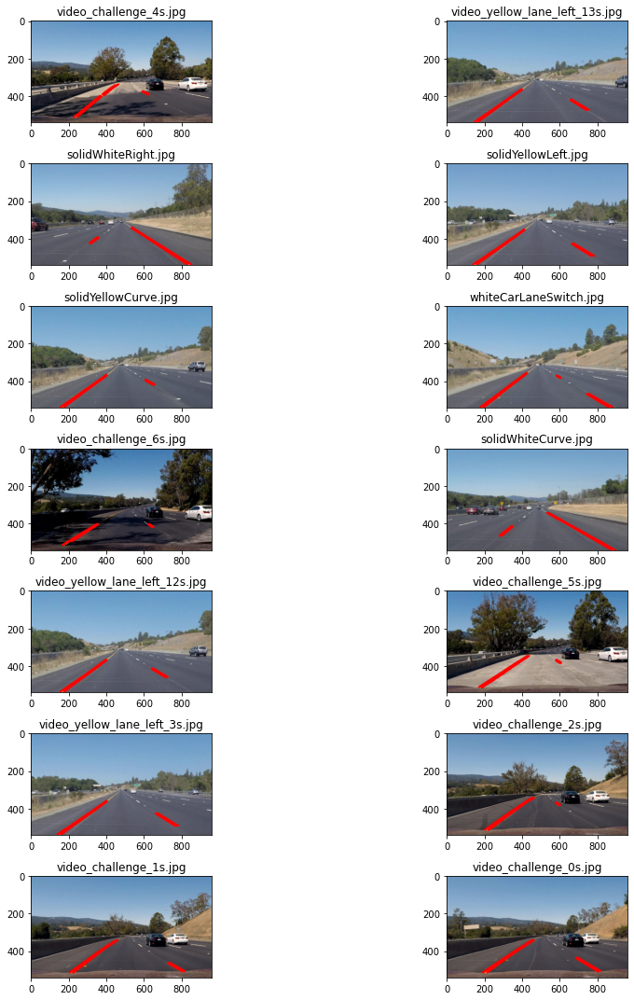

In [68]:
img_with_lines = list(map(lambda img, lines: draw_lines(img, lines), original_images, hough_lines_per_image))    
show_image_list(img_with_lines, fig_size=(15, 15))

The lanes are very clearly identified. There is one image where a small patch of lane has been rejected by the algorithm, due to the high threshold I specified. That's still ok as the bigger lane line was correctly identified.

### Separating Left And Right Lanes

To be able to trace a full line and connect lane markings on the image, we must be able to distinguish left from right lanes. Fortunately, there is a trivial way to do so. If you carefully look the image (may be easier with the canny segmented images), you can derive the gradient (i.e slope) of any left or right lane line:
* left lane: **as x value (i.e. width) increases, y value (i.e. height) decreases: slope must thus be negative**
* right lane:**as x value (i.e. width) increases, y value (i.e. height) increases: slope must thus be positive**

We can therefore define a function that separates lines into a left and right one

In [69]:
def separate_lines(lines, img):
    img_shape = img.shape
    
    middle_x = img_shape[1] / 2
    
    left_lane_lines = []
    right_lane_lines = []

    for line in lines:
        for x1, y1, x2, y2 in line:
            dx = x2 - x1 
            if dx == 0:
                #Discarding line since we can't gradient is undefined at this dx
                continue
            dy = y2 - y1
            
            # Similarly, if the y value remains constant as x increases, discard line
            if dy == 0:
                continue
            
            slope = dy / dx
            
            # This is pure guess than anything... 
            # but get rid of lines with a small slope as they are likely to be horizontal one
            epsilon = 0.1
            if abs(slope) <= epsilon:
                continue
            
            if slope < 0 and x1 < middle_x and x2 < middle_x:
                # Lane should also be within the left hand side of region of interest
                left_lane_lines.append([[x1, y1, x2, y2]])
            elif x1 >= middle_x and x2 >= middle_x:
                # Lane should also be within the right hand side of region of interest
                right_lane_lines.append([[x1, y1, x2, y2]])
    
    return left_lane_lines, right_lane_lines

In [70]:
separated_lanes_per_image = list(map(lambda lines, img: separate_lines(lines, img), hough_lines_per_image, original_images))

In [71]:
def color_lanes(img, left_lane_lines, right_lane_lines, left_lane_color=[255, 0, 0], right_lane_color=[0, 0, 255]):
    left_colored_img = draw_lines(img, left_lane_lines, color=left_lane_color, make_copy=True)
    right_colored_img = draw_lines(left_colored_img, right_lane_lines, color=right_lane_color, make_copy=False)
    
    return right_colored_img

In [72]:
img_different_lane_colors = list(map(lambda img, separated_lanes: color_lanes(img, separated_lanes[0], separated_lanes[1]), original_images, separated_lanes_per_image))

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


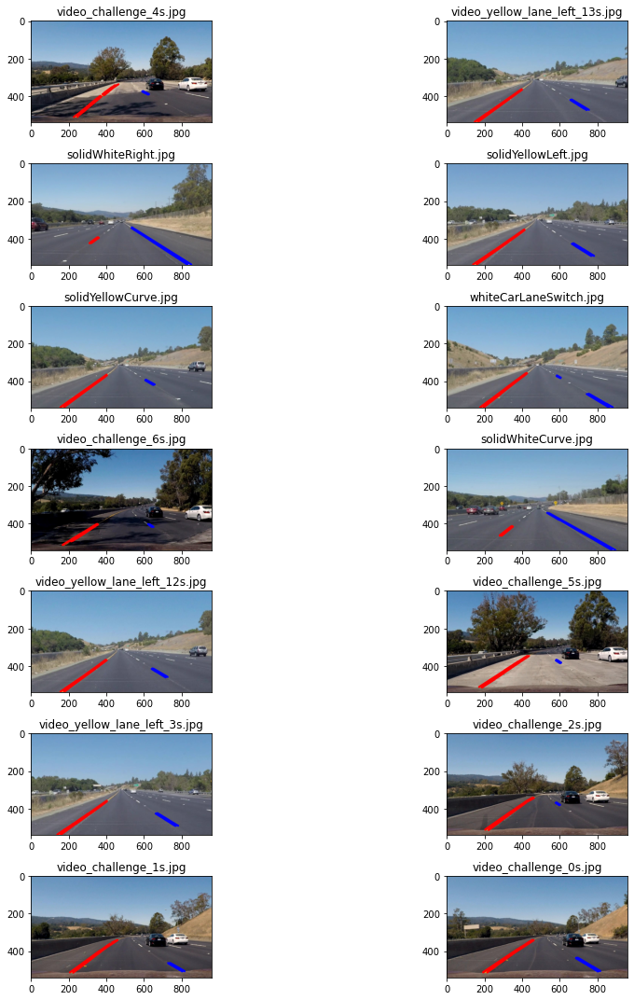

In [73]:
show_image_list(img_different_lane_colors)

As you can see above, left and right lanes are perfectly separated. 

### Lane Extrapolation

To trace a full line from the bottom of the screen to the highest point of our region of interest, we must be able to interpolate the different points on a given lane and find a line that minimise the distance across those points. Basically this is a [linear regression](https://en.wikipedia.org/wiki/Regression_analysis) problem. We will attempt to find the line on a given lane by minimising the [least squares](https://en.wikipedia.org/wiki/Least_squares) error.

In [74]:
from scipy import stats

def find_lane_lines_formula(lines):
    xs = []
    ys = []
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            xs.append(x1)
            xs.append(x2)
            ys.append(y1)
            ys.append(y2)
    
    slope, intercept, r_value, p_value, std_err = stats.linregress(xs, ys)
    
    # Remember, a straight line is expressed as f(x) = Ax + b. Slope is the A, while intercept is the b
    return (slope, intercept)
    

We now define a function to trace a line on the lane:

In [75]:
def trace_lane_line(img, lines, top_y, make_copy=True):
    A, b = find_lane_lines_formula(lines)
    vert = get_vertices_for_img(img)

    img_shape = img.shape
    bottom_y = img_shape[0] - 1
    # y = Ax + b, therefore x = (y - b) / A
    x_to_bottom_y = (bottom_y - b) / A
    
    top_x_to_y = (top_y - b) / A 
    
    new_lines = [[[int(x_to_bottom_y), int(bottom_y), int(top_x_to_y), int(top_y)]]]
    return draw_lines(img, new_lines, make_copy=make_copy)

def trace_both_lane_lines(img, left_lane_lines, right_lane_lines):
    vert = get_vertices_for_img(img)
    region_top_left = vert[0][1]
    
    full_left_lane_img = trace_lane_line(img, left_lane_lines, region_top_left[1], make_copy=True)
    full_left_right_lanes_img = trace_lane_line(full_left_lane_img, right_lane_lines, region_top_left[1], make_copy=False)
    
    # image1 * α + image2 * β + λ
    # image1 and image2 must be the same shape.
    img_with_lane_weight =  cv2.addWeighted(img, 0.7, full_left_right_lanes_img, 0.3, 0.0)
    
    return img_with_lane_weight

In [76]:
full_lane_drawn_images = list(map(lambda img, separated_lanes : trace_both_lane_lines(img, separated_lanes[0], separated_lanes[1]), 
                                  original_images, separated_lanes_per_image))

<ipython-input-33-85e3ec791b95>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, cols, i+1)


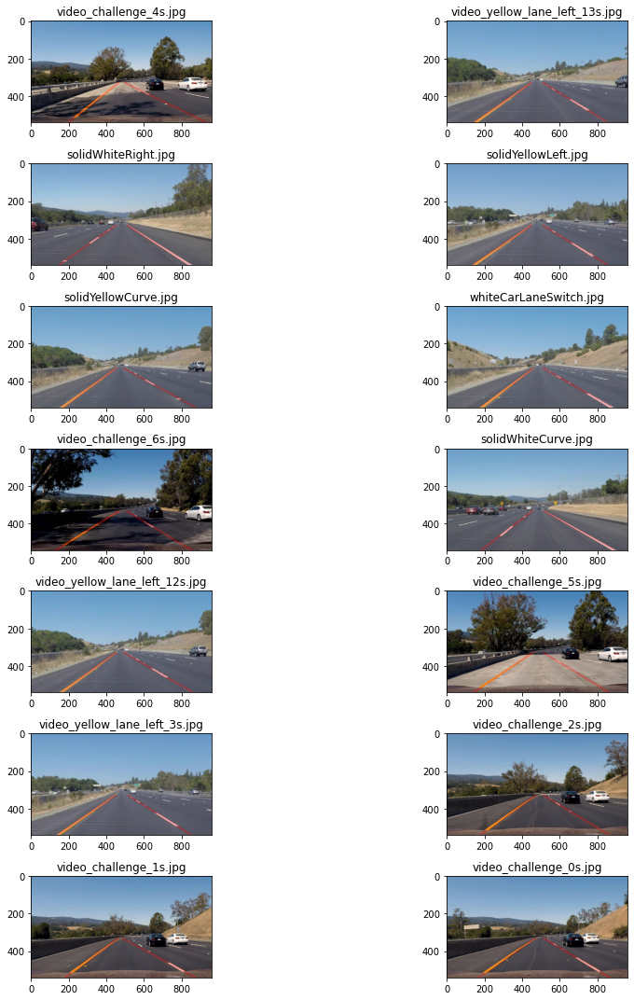

In [77]:
show_image_list(full_lane_drawn_images)

# Lane Detection On Videos

For this part, we read a video each frame at a time and modify the frame with the overlapping lines. To get started, we need `pipeline` function that takes in a frame and returns the processed frame. 

## Lane Detector With Memory

A video is a sequence of frames. We can therefore use the information from previous frames to smoothen the lines that we trace on the road and take corrective steps if at frame t our computed lines differ disproportionately from the mean of line slopes and intercepts we computed from frames [0, t-1].

We therefore need to impart the concept of _memory_ into our pipeline. We will use a standard Python [_deque_](https://docs.python.org/2/library/collections.html#collections.deque) to store the last N computed line coefficients. One further step to explore would be to calculate the weighted average of these coefficients, giving a higher weight to more recent coefficients as they belong to more recent frames; I believe frame locality would play a critical role in getting near-perfect lines on video. 

In [78]:
from collections import deque

def create_lane_line_coefficients_list(length = 10):
    return deque(maxlen=length)

In [79]:
def trace_lane_line_with_coefficients(img, line_coefficients, top_y, make_copy=True):
    A = line_coefficients[0]
    b = line_coefficients[1]
    
    img_shape = img.shape
    bottom_y = img_shape[0] - 1
    # y = Ax + b, therefore x = (y - b) / A
    x_to_bottom_y = (bottom_y - b) / A
    
    top_x_to_y = (top_y - b) / A 
    
    new_lines = [[[int(x_to_bottom_y), int(bottom_y), int(top_x_to_y), int(top_y)]]]
    return draw_lines(img, new_lines, make_copy=make_copy)


def trace_both_lane_lines_with_lines_coefficients(img, left_line_coefficients, right_line_coefficients):
    vert = get_vertices_for_img(img)
    region_top_left = vert[0][1]
    
    full_left_lane_img = trace_lane_line_with_coefficients(img, left_line_coefficients, region_top_left[1], make_copy=True)
    full_left_right_lanes_img = trace_lane_line_with_coefficients(full_left_lane_img, right_line_coefficients, region_top_left[1], make_copy=False)
    
    # image1 * α + image2 * β + λ
    # image1 and image2 must be the same shape.
    img_with_lane_weight =  cv2.addWeighted(img, 0.7, full_left_right_lanes_img, 0.3, 0.0)
    
    return img_with_lane_weight

In [80]:
import math

MAXIMUM_SLOPE_DIFF = 0.1
MAXIMUM_INTERCEPT_DIFF = 50.0

class LaneDetectorWithMemory:
    def __init__(self):
        self.left_lane_coefficients  = create_lane_line_coefficients_list()
        self.right_lane_coefficients = create_lane_line_coefficients_list()
        
        self.previous_left_lane_coefficients = None
        self.previous_right_lane_coefficients = None
        
    
    def mean_coefficients(self, coefficients_queue, axis=0):        
        return [0, 0] if len(coefficients_queue) == 0 else np.mean(coefficients_queue, axis=axis)
    
    def determine_line_coefficients(self, stored_coefficients, current_coefficients):
        if len(stored_coefficients) == 0:
            stored_coefficients.append(current_coefficients) 
            return current_coefficients
        
        mean = self.mean_coefficients(stored_coefficients)
        abs_slope_diff = abs(current_coefficients[0] - mean[0])
        abs_intercept_diff = abs(current_coefficients[1] - mean[1])
        
        if abs_slope_diff > MAXIMUM_SLOPE_DIFF or abs_intercept_diff > MAXIMUM_INTERCEPT_DIFF:
            #print("Identified big difference in slope (", current_coefficients[0], " vs ", mean[0],
             #    ") or intercept (", current_coefficients[1], " vs ", mean[1], ")")
            
            # In this case use the mean
            return mean
        else:
            # Save our coefficients and returned a smoothened one
            stored_coefficients.append(current_coefficients)
            return self.mean_coefficients(stored_coefficients)
        

    def lane_detection_pipeline(self, img):
        combined_hsl_img = filter_img_hsl(img)
        grayscale_img = grayscale(combined_hsl_img)
        gaussian_smoothed_img = gaussian_blur(grayscale_img, kernel_size=5)
        canny_img = canny_edge_detector(gaussian_smoothed_img, 50, 150)
        segmented_img = region_of_interest(canny_img)
        hough_lines = hough_transform(segmented_img, rho, theta, threshold, min_line_length, max_line_gap)

        try:
            left_lane_lines, right_lane_lines = separate_lines(hough_lines, img)
            left_lane_slope, left_intercept = find_lane_lines_formula(left_lane_lines)
            right_lane_slope, right_intercept = find_lane_lines_formula(right_lane_lines)
            smoothed_left_lane_coefficients = self.determine_line_coefficients(self.left_lane_coefficients, [left_lane_slope, left_intercept])
            smoothed_right_lane_coefficients = self.determine_line_coefficients(self.right_lane_coefficients, [right_lane_slope, right_intercept])
            img_with_lane_lines = trace_both_lane_lines_with_lines_coefficients(img, smoothed_left_lane_coefficients, smoothed_right_lane_coefficients)
        
            return img_with_lane_lines

        except Exception as e:
            print("*** Error - will use saved coefficients ", e)
            smoothed_left_lane_coefficients = self.determine_line_coefficients(self.left_lane_coefficients, [0.0, 0.0])
            smoothed_right_lane_coefficients = self.determine_line_coefficients(self.right_lane_coefficients, [0.0, 0.0])
            img_with_lane_lines = trace_both_lane_lines_with_lines_coefficients(img, smoothed_left_lane_coefficients, smoothed_right_lane_coefficients)
        
            return img_with_lane_lines

## Solid White Lane Markings

This is the first test video, and arguably the easiest.

In [82]:
!pip install moviepy

     |████████████████████████████████| 388 kB 2.8 MB/s eta 0:00:01
     |████████████████████████████████| 26.9 MB 2.8 MB/s eta 0:00:01    |██▎                             | 1.9 MB 3.1 MB/s eta 0:00:09     |███                             | 2.5 MB 3.1 MB/s eta 0:00:08     |█████▎                          | 4.5 MB 3.9 MB/s eta 0:00:06     |███████████████████▍            | 16.3 MB 1.3 MB/s eta 0:00:08     |████████████████████████████▋   | 24.1 MB 2.3 MB/s eta 0:00:02     |█████████████████████████████▉  | 25.1 MB 3.7 MB/s eta 0:00:01
  Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110724 sha256=0b8563247ac51831a18cc8a13597115078426c2bebbe1fa0dac3ad1ed5fde509
  Stored in directory: /home/mayank/.cache/pip/wheels/e4/a4/db/0368d3a04033da662e13926594b3a8cf1aa4ffeefe570cfac1
  Created wheel for proglog: filename=proglog-0.1.9-py3-none-any.whl size=6147 sha256=85f3df6c5fa464460e333a391c0e0bddada8378383dc661f0a058f010041e56a
  Stored in directory: /home/mayank/.cach

In [84]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [85]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
detector = LaneDetectorWithMemory()

clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(detector.lane_detection_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

t:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

Moviepy - Building video test_videos_output/solidWhiteRight.mp4.
Moviepy - Writing video test_videos_output/solidWhiteRight.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/solidWhiteRight.mp4
CPU times: user 16.3 s, sys: 4.26 s, total: 20.6 s
Wall time: 46.5 s


In [86]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Yellow And White Lane Markings

This second video is slightly more tricky because of the yellow markings

In [87]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')



detector = LaneDetectorWithMemory()
yellow_clip = clip2.fl_image(detector.lane_detection_pipeline)
%time yellow_clip.write_videofile(yellow_output, audio=False)

t:   0%|          | 3/681 [00:00<00:27, 24.68it/s, now=None]

Moviepy - Building video test_videos_output/solidYellowLeft.mp4.
Moviepy - Writing video test_videos_output/solidYellowLeft.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/solidYellowLeft.mp4
CPU times: user 49.1 s, sys: 13.5 s, total: 1min 2s
Wall time: 1min 44s


In [88]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Challenge Video

This one is hard as it contains slight curves on the road a few meters further... Since we use plain linear regression to produce a polynomial of degree 1 (y = Ax<sup>1</sup> + b), we cannot properly fit a straight line around a curve. Nevertheless for we are able to accurately detect the lane markings some meters ahead, before the road curves. 

In [89]:
challenge_output = 'test_videos_output/challenge.mp4'
clip3 = VideoFileClip('test_videos/challenge.mp4')



detector = LaneDetectorWithMemory()
challenge_clip = clip3.fl_image(detector.lane_detection_pipeline)
%time challenge_clip.write_videofile(challenge_output, audio=False)

t:   0%|          | 0/251 [00:00<?, ?it/s, now=None]

Moviepy - Building video test_videos_output/challenge.mp4.
Moviepy - Writing video test_videos_output/challenge.mp4



t:  59%|█████▉    | 149/251 [00:27<00:18,  5.60it/s, now=None]

*** Error - will use saved coefficients  Inputs must not be empty.


Moviepy - Done !
Moviepy - video ready test_videos_output/challenge.mp4
CPU times: user 26.2 s, sys: 5.52 s, total: 31.7 s
Wall time: 60 s


In [90]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))